<h1> Hajj Crowd Abnormal Behavior Detection
<h3> The Dataset </h3>
<p> The original dataset: </p>
<ul>
<li> Training set: </li>
<li> Testing set: </li>
</ul>
<p> The extracted dataset: </p>
<ul>
<li> Training set: </li>
<li> Testing set: </li>
</ul>


In [ ]:
# importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import cv2
import os
import tensorflow as tf
import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from PIL import Image, ImageDraw

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/HAJJv2.Dataset.zip

Archive:  /content/drive/MyDrive/HAJJv2.Dataset.zip
   creating: HAJJv2.Dataset/
  inflating: __MACOSX/._HAJJv2.Dataset  
  inflating: HAJJv2.Dataset/.DS_Store  
  inflating: __MACOSX/HAJJv2.Dataset/._.DS_Store  
   creating: HAJJv2.Dataset/Training/
  inflating: __MACOSX/HAJJv2.Dataset/._Training  
   creating: HAJJv2.Dataset/Testing/
  inflating: __MACOSX/HAJJv2.Dataset/._Testing  
  inflating: HAJJv2.Dataset/Readme.txt  
  inflating: __MACOSX/HAJJv2.Dataset/._Readme.txt  
   creating: HAJJv2.Dataset/.ipynb_checkpoints/
  inflating: HAJJv2.Dataset/Training/.DS_Store  
  inflating: __MACOSX/HAJJv2.Dataset/Training/._.DS_Store  
   creating: HAJJv2.Dataset/Training/Labels/
  inflating: __MACOSX/HAJJv2.Dataset/Training/._Labels  
   creating: HAJJv2.Dataset/Training/Videos/
  inflating: __MACOSX/HAJJv2.Dataset/Training/._Videos  
  inflating: HAJJv2.Dataset/Testing/.DS_Store  
  inflating: __MACOSX/HAJJv2.Dataset/Testing/._.DS_Store  
   creating: HAJJv2.Dataset/Testing/Labels/
  inflat

In [ ]:
# creating the video frames extraction function

def extract_frames_from_videos(video_path, output_folder):
    for i in [2, 3, 5, 7, 8, 9, 10, 11, 12]:
        video_file = os.path.join(video_path, f"{i}.mp4")
        cam = cv2.VideoCapture(video_file)

        try:
            # Creating a folder for extracted frames
            if not os.path.exists(output_folder):
                os.makedirs(output_folder)
        except OSError:
            print('Error: Creating directory for data')

        currentframe = 1

        total_frames = int(cam.get(cv2.CAP_PROP_FRAME_COUNT))
        with tqdm(total=total_frames) as pbar:
            while True:
                ret, frame = cam.read()

                if ret:
                    # If video is still left, continue creating images
                    name = os.path.join(output_folder, f'{i}_{currentframe}.jpg')
                    #print('Creating...' + name)

                    # Writing the extracted images
                    cv2.imwrite(name, frame)

                    currentframe += 1
                    pbar.update(1)
                else:
                    break

        # Release video and close windows once done
        cam.release()
        cv2.destroyAllWindows()

In [ ]:
# creating the target csv files function
def concatenate_csv_files(directory, output_file):
    dfs = []

    for filename in os.listdir(directory):
        if filename.endswith(".csv"):
            file_path = os.path.join(directory, filename)
            df = pd.read_csv(file_path)
            dfs.append(df)

    concatenated_df = pd.concat(dfs, ignore_index=True)

    concatenated_df.to_csv(output_file, index=False)

In [ ]:
# creating the the extracted frames (images) and labels combination into csv file function
def add_image_paths_to_dataframe(input_csv_file):
    train_df = pd.read_csv(input_csv_file)

    train_df['image_path'] = train_df.apply(
        lambda row: f"{row['Video_No']}_{row['Frame_No']}.jpg", axis=1
    )

    train_df.to_csv(input_csv_file, index=False)

    return train_df

# Data Preperation

### Preparing Training Dataset

In [ ]:
# setting up the train videos paths

video_path = "/content/HAJJv2.Dataset/Training/Videos"
output_folder = "/content/HAJJv2.Dataset/Extracted_Data/Train"
extract_frames_from_videos(video_path, output_folder)

100%|██████████| 700/700 [00:08<00:00, 86.22it/s]


In [ ]:
# setting up the train labels paths

input_directory = '/content/HAJJv2.Dataset/Training/Labels'
output_file = '/content/HAJJv2.Dataset/Extracted_Data/Train_Labels.csv'
concatenate_csv_files(input_directory, output_file)

In [ ]:
# setting up the train video/label paths

input_csv_file = '/content/HAJJv2.Dataset/Extracted_Data/Train_Labels.csv'
train_df = add_image_paths_to_dataframe(input_csv_file)
train_df

,Video_No,Frame_No,X,Y,Width,Height,Classes,Obj_Name,image_path
0,10,1,130,1020,101,61,sitting,sitting1,10_1.jpg
1,10,1,171,981,102,97,sitting,sitting2,10_1.jpg
2,10,1,219,965,97,111,sitting,sitting3,10_1.jpg
3,10,1,239,871,120,140,sitting,sitting4,10_1.jpg
4,10,1,273,858,93,93,sitting,sitting5,10_1.jpg
...,...,...,...,...,...,...,...,...,...
170767,7,700,446,210,50,102,moving_in_opposite,movingo6,7_700.jpg
170768,7,700,226,356,70,167,moving_in_opposite,movingo9,7_700.jpg
170769,7,700,268,475,82,197,moving_in_opposite,movingo10,7_700.jpg
170770,7,700,208,444,75,212,moving_in_opposite,movingo11,7_700.jpg


### Preparing Testing Dataset

In [ ]:
# setting up the test videos paths

video_path = "/content/HAJJv2.Dataset/Testing/Videos"
output_folder = "/content/HAJJv2.Dataset/Extracted_Data/Test"
extract_frames_from_videos(video_path, output_folder)

100%|██████████| 501/501 [00:05<00:00, 90.89it/s]


In [ ]:
# setting up the test labels paths

input_directory = '/content/HAJJv2.Dataset/Testing/Labels'
output_file = '/content/HAJJv2.Dataset/Extracted_Data/Test_Labels.csv'
concatenate_csv_files(input_directory, output_file)

In [ ]:
# setting up the test video/label paths

input_csv_file = '/content/HAJJv2.Dataset/Extracted_Data/Test_Labels.csv'
test_df = add_image_paths_to_dataframe(input_csv_file)
test_df

,Video_No,Frame_No,X,Y,Width,Height,Classes,Obj_Name,image_path
0,7,1,6,593,77,89,sitting,sitting1,7_1.jpg
1,7,1,52,520,92,110,sitting,sitting2,7_1.jpg
2,7,1,91,480,83,104,sitting,sitting3,7_1.jpg
3,7,1,311,317,70,53,sitting,sitting5,7_1.jpg
4,7,1,318,307,53,46,sitting,sitting6,7_1.jpg
...,...,...,...,...,...,...,...,...,...
170526,3,492,1292,696,128,183,sitting,sitting7,3_492.jpg
170527,3,492,1364,710,77,184,sitting,sitting8,3_492.jpg
170528,3,492,416,104,60,152,standing,standing1,3_492.jpg
170529,3,492,422,41,54,135,standing,standing10,3_492.jpg


# Images Preprocessing & Visualization

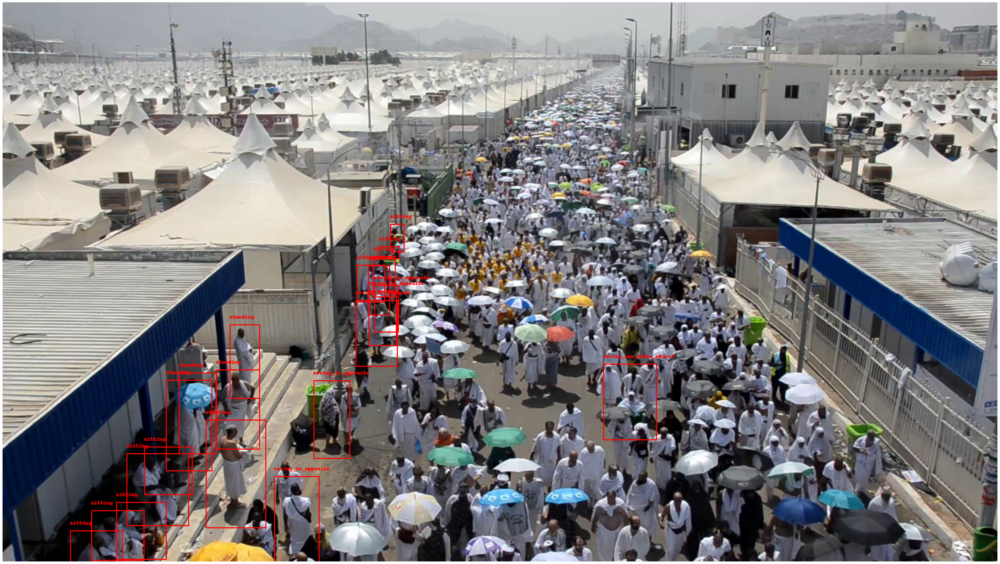

In [ ]:

# Load the CSV file into a DataFrame
csv_file = '/content/HAJJv2.Dataset/Extracted_Data/Train_Labels.csv'  # The path to the CSV file
df = pd.read_csv(csv_file)

# The image that we want to visualize
selected_image_path = '10_1.jpg'

# Filter the DataFrame to select rows corresponding to the chosen image
selected_rows = df[df['image_path'] == selected_image_path]

# Load the chosen image
image_directory = '/content/HAJJv2.Dataset/Extracted_Data/Train'  # The path to the images files
image_filename = os.path.join(image_directory, selected_image_path)

if os.path.exists(image_filename):
    image = Image.open(image_filename)
else:
    print(f"Image file not found: {image_filename}")
    exit()

# Create a drawing context on the image and draw the object names
draw = ImageDraw.Draw(image)

for index, row in selected_rows.iterrows():
    x = row['X']
    y = row['Y']
    width = row['Width']
    height = row['Height']

    # Define a bounding box using the annotation values
    bbox = [(x, y), (x + width, y + height)]

    # Draw a rectangle (bounding box) on the image
    draw.rectangle(bbox, outline="red", width=2)

    # Display the class or object name as text
    obj_name = row['Classes']
    draw.text((x, y - 20), obj_name, fill="red")

# Show the image with object names
fig = plt.figure(figsize=(50, 50))
plt.imshow(image)
plt.axis('off')  # Turn off axis labels and ticks
plt.show()

In [ ]:
# Load labels data
train_labels = pd.read_csv('/content/content/HAJJv2.Dataset/Extracted_Data/Train_Labels.csv')
test_labels = pd.read_csv('/content/content/HAJJv2.Dataset/Extracted_Data/Test_Labels.csv')

In [ ]:
# Load iamges data
train_image_path = '/content/content/HAJJv2.Dataset/Extracted_Data/Train'
test_image_path = '/content/content/HAJJv2.Dataset/Extracted_Data/Test'

# Model Building

In [ ]:
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData' , exist_ok= True)

In [ ]:
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/images' , exist_ok= True)
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/labels' , exist_ok= True)

# create validation data folder
os.makedirs("/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/valData" , exist_ok= True)
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/valData/images' , exist_ok= True)
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/valData/labels' , exist_ok= True )

# create test data folder
os.makedirs("/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/testData" , exist_ok= True)
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/testData/images' , exist_ok= True)
os.makedirs('/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/testData/labels' , exist_ok= True)

In [ ]:
train_labels.Classes.unique()

array(['moving_in_opposite', 'standing', 'different_crowd_direction',
       'sleeping', 'sitting', 'moving_non_human_object', 'running'],
      dtype=object)

In [ ]:
dict = {"moving_in_opposite" : 0, "standing" : 1, "different_crowd_direction": 2, "sleeping" : 3, "sitting": 4, "moving_non_human_object":5 ,
        "running": 6 }
train_labels=train_labels.replace({"Classes": dict})

In [ ]:
train_labels

,Video_No,Frame_No,X,Y,Width,Height,Classes,Obj_Name,image_path
0,12,1,265,320,18,25,0,movingo1,12_1.jpg
1,12,1,64,440,18,29,0,movingo3,12_1.jpg
2,12,1,321,383,18,27,0,movingo14,12_1.jpg
3,12,1,333,400,16,20,0,movingo16,12_1.jpg
4,12,1,316,350,15,25,0,movingo19,12_1.jpg
...,...,...,...,...,...,...,...,...,...
170767,7,700,446,210,50,102,0,movingo6,7_700.jpg
170768,7,700,226,356,70,167,0,movingo9,7_700.jpg
170769,7,700,268,475,82,197,0,movingo10,7_700.jpg
170770,7,700,208,444,75,212,0,movingo11,7_700.jpg


In [ ]:
test_labels=test_labels.replace({"Classes": dict})

In [ ]:
test_labels

,Video_No,Frame_No,X,Y,Width,Height,Classes,Obj_Name,image_path
0,5,1,1327,806,114,157,3,sleeping1,5_1.jpg
1,5,1,1,530,62,127,4,sitting1,5_1.jpg
2,5,1,27,533,70,157,4,sitting2,5_1.jpg
3,5,1,229,302,60,90,4,sitting3,5_1.jpg
4,5,1,204,335,59,81,4,sitting4,5_1.jpg
...,...,...,...,...,...,...,...,...,...
170526,3,492,1292,696,128,183,4,sitting7,3_492.jpg
170527,3,492,1364,710,77,184,4,sitting8,3_492.jpg
170528,3,492,416,104,60,152,1,standing1,3_492.jpg
170529,3,492,422,41,54,135,1,standing10,3_492.jpg


In [ ]:
import shutil

In [ ]:
Width_image=1440
height_image=1080

In [ ]:
train = train_labels[:136618]

for i , row in train.iterrows():

    width    = row["Width"]/Width_image
    height   = row["Height"]/height_image

    X = row["X"]/Width_image
    Y = row["Y"] /height_image

    x_center = X+(width/2)
    y_center = Y+(height/2)
    cls = row['Classes']
    name = row['image_path'].split('.')[0]
    # save the new annotation results into a txt files
    with open(f'/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/labels/{name}.txt' , 'a') as f : # 'a' append mode to make one txt file per image
        f.write(str(cls) + ' ' + str(x_center) + ' ' + str(y_center) + ' ' +  str(width) + ' ' + str(height) + '\n' )


# copy the training images to training folder
training_no_dub = train.drop_duplicates(subset = ['image_path'])
for i ,  row in training_no_dub.iterrows():
    name = row['image_path'].split('.')[0]
    shutil.copy(f'/content/content/HAJJv2.Dataset/Extracted_Data/Train/{name}.jpg' , f'/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/images/{name}.jpg'  )

In [ ]:
# 20 % for val
Val = train_labels[136619:]

for i , row in Val.iterrows():

    width    = row["Width"]/Width_image
    height   = row["Height"]/height_image

    X = row["X"]/Width_image
    Y = row["Y"] /height_image

    x_center = X+(width/2)
    y_center = Y+(height/2)

    cls = row['Classes']
    name = row['image_path'].split('.')[0]
    # save the new annotation results into a txt files
    with open(f'/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/valData/labels/{name}.txt' , 'a') as f : # 'a' append mode to make one txt file per image
        f.write(str(cls) + ' ' + str(x_center) + ' ' + str(y_center) + ' ' +  str(width) + ' ' + str(height) + '\n' )


# copy the training images to training folder
training_no_dub = Val.drop_duplicates(subset = ['image_path'])
for i ,  row in training_no_dub.iterrows():
    name = row['image_path'].split('.')[0]
    shutil.copy(f'/content/content/HAJJv2.Dataset/Extracted_Data/Train/{name}.jpg' , f'/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/valData/images/{name}.jpg'  )

In [ ]:
test = test_labels[:]

for i , row in test.iterrows():

    width    = row["Width"]/Width_image
    height   = row["Height"]/height_image

    X = row["X"]/Width_image
    Y = row["Y"] /height_image

    x_center = X+(width/2)
    y_center = Y+(height/2)

    cls = row['Classes']
    name = row['image_path'].split('.')[0]
    # save the new annotation results into a txt files
    with open(f'/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/testData/labels/{name}.txt' , 'a') as f : # 'a' append mode to make one txt file per image
        f.write(str(cls) + ' ' + str(x_center) + ' ' + str(y_center) + ' ' +  str(width) + ' ' + str(height) + '\n' )


# copy the training images to training folder
training_no_dub = test.drop_duplicates(subset = ['image_path'])
for i ,  row in training_no_dub.iterrows():
    name = row['image_path'].split('.')[0]
    shutil.copy(f'/content/content/HAJJv2.Dataset/Extracted_Data/Test/{name}.jpg' , f'/content/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/testData/images/{name}.jpg'  )

In [ ]:
!unzip /content/drive/MyDrive/Video/YOLOv5.zip

In [ ]:
cd YOLOv5

In [ ]:
cd yolov5

In [ ]:
!pip install -r requirements.txt

In [ ]:
!python train.py --data /content/data.yaml --cfg yolov5-mobilenet.yaml --batch-size -1 --epochs 300 --cache

In [69]:
!zip -r /content/drive/MyDrive/yolonew.zip /content/YOLOv5/yolov5/runs/train/exp11

  adding: content/YOLOv5/yolov5/runs/train/exp11/ (stored 0%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/P_curve.png (deflated 7%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/R_curve.png (deflated 12%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/val_batch0_labels.jpg (deflated 6%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/PR_curve.png (deflated 11%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/results.csv (deflated 83%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/weights/ (stored 0%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/weights/last.pt (deflated 13%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/weights/best.pt (deflated 14%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/val_batch0_pred.jpg (deflated 5%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/labels.jpg (deflated 28%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/val_batch1_pred.jpg (deflated 5%)
  adding: content/YOLOv5/yolov5/runs/train/exp11/results.png (deflated 6%)
  a

In [71]:
!python detect.py --weights /content/YOLOv5/yolov5/runs/train/exp11/weights/best.pt --source /content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/images/10_100.jpg

detect: weights=['/content/YOLOv5/yolov5/runs/train/exp11/weights/best.pt'], source=/content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/images/10_100.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-217-g8c45e51 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)

Fusing layers... 
YOLOv5-mobilenet summary: 186 layers, 5972120 parameters, 0 gradients, 41.9 GFLOPs
image 1/1 /content/HAJJv2.Dataset/Extracted_Data/YOLO_Data/trainData/images/10_100.jpg: 384x640 1 moving_in_opposite, 3 standings, 7 sittings, 54.1ms
Speed: 0.6ms pre-process, 54.1ms inference, 1.6ms NMS per image at shape (1